In [86]:
import pandas as pd
%matplotlib inline
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import plotly
import plotly.graph_objs as go
import math
import scipy.optimize as optimize

In [34]:
data = pd.read_csv('weights_heights.csv', index_col='Index')
data.head()

,Height,Weight
Index,,
1,65.78331,112.9925
2,71.51521,136.4873
3,69.39874,153.0269
4,68.21660,142.3354
5,67.78781,144.2971


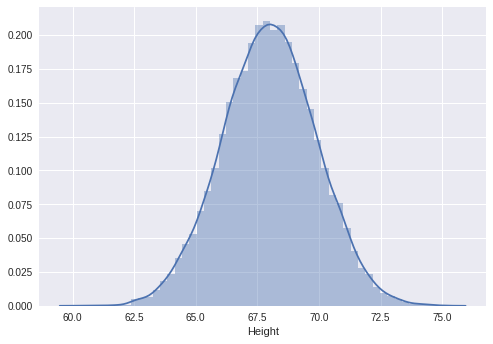

In [18]:
ax = sns.distplot(data['Height'])

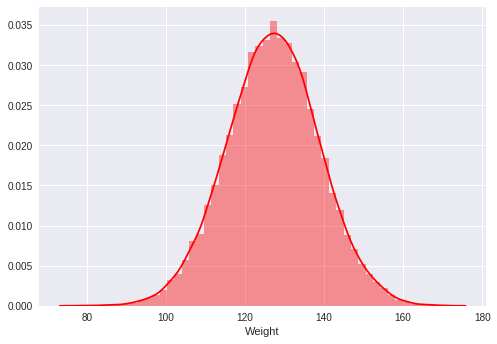

In [15]:
ax = sns.distplot(data['Weight'], color="r")

In [4]:
data['BMI'] = data['Weight']/data['Height'].pow(2)
data.head(3)

,Height,Weight,BMI
Index,,,
1,65.78331,112.9925,0.026111
2,71.51521,136.4873,0.026687
3,69.39874,153.0269,0.031773


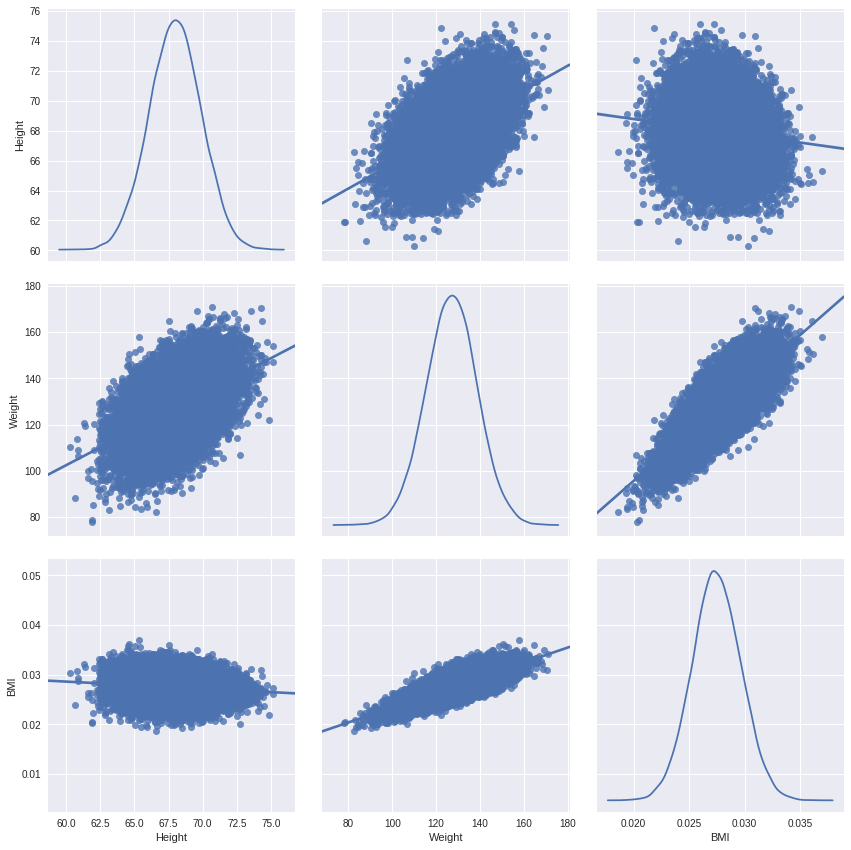

In [24]:
g = sns.pairplot(data, kind="reg",diag_kind='kde', size=4)

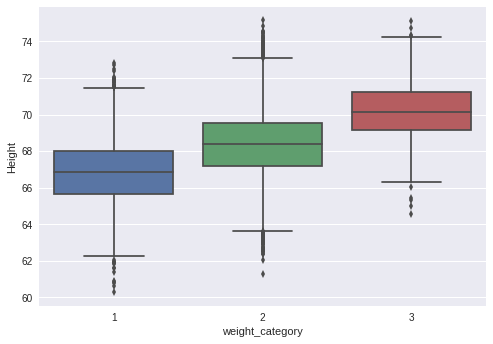

In [5]:
data['weight_category']=[1 if weight < 120 else 2 if weight < 150 else 3 for weight in data.Weight]
ax = sns.boxplot(x="weight_category", y="Height", data=data)

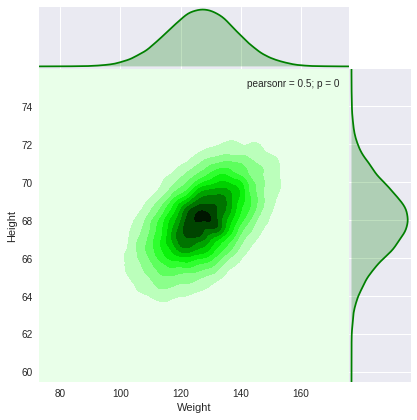

In [35]:
g = sns.jointplot("Weight", "Height", data=data, kind="kde", space=0, color="g")

In [6]:
def error(x, y, w0, w1):
    sum1 = 0
    for i in range(len(x)):
        sum1 += pow((y[i] - w0 - w1*x[i]), 2)
    return sum1

In [30]:
trace0 = go.Scatter(
    x = data.Weight,
    y = data.Height,
    mode = 'markers',
    name = 'Наше множество')
trace1 = go.Scatter(
    x = data.Weight,
    y = 55 + 0.04*data.Weight,
   name = 'прямая 1')
trace2 = go.Scatter(
    x = data.Weight,
    y = 50 + 0.22*data.Weight,
   name = 'прямая 2')
data1=[trace0, trace1, trace2]
layout1 = {'title': 'Две прямые'}
fig1 = go.Figure(data=data1, layout=layout1)
iplot(fig1, show_link=False)

In [43]:
w1 = np.linspace(-1, 1, 1000)
trace3 = go.Scatter(
    x = w1,
    y = error(data['Weight'].values, data['Height'].values, 50, w1),
    name = 'график')
data2=[trace3]
layout2 = {'title': 'Зависимость ошибки от параметра w1'}
fig2 = go.Figure(data=data2, layout=layout2)
iplot(fig2, show_link=False)

In [29]:
eta = 1
minerr = math.pow(10, 10)
x = -1
while eta>math.pow(10, -10):
    if error(data.Weight.values, data.Height.values, 50, x+eta)<minerr:
        x += eta
        minerr = error(data.Weight.values, data.Height.values, 50, x)
    else:
        eta = eta/10
print(x, minerr)       

0.1411 79512.2431009


In [31]:
trace4 = go.Scatter(
    x = data.Weight,
    y = 50 + x*data.Weight,
    name = 'мимимум')
data1=[trace0, trace1, trace2, trace4]
layout1 = {'title': 'Три прямые'}
fig1 = go.Figure(data=data1, layout=layout1)
iplot(fig1, show_link=False)

In [85]:
w0 = np.linspace(-100, 100, 50)
w1 = np.linspace(-5, 5, 50)
z = np.ndarray((50, 50))
for i in range(len(w0)):
    for j in range(len(w1)):
        z[i, j] = error(data.Weight.values, data.Height.values, w0[i], w1[j])
data6 = [go.Surface(x=w0, y=w1, z=z)]
layout = go.Layout(
    title='Искомая плоскость',
    autosize=False,
    width=600,
    height=600,
)
fig = go.Figure(data=data6, layout=layout)
iplot(fig, show_link=False)

In [106]:
err = lambda x: sum([math.pow(data.Height.values[i]-x[0]-x[1]*data.Weight.values[i], 2) for i in range(len(data.Weight.values))])
result = optimize.minimize(err, x0=[0, 0], method = 'L-BFGS-B', bounds=((-100,100),(-5,5)))
print(result)

      fun: 67545.28708784045
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 0.00582077,  0.02910383])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 51
      nit: 12
   status: 0
  success: True
        x: array([ 57.57182064,   0.08200614])
